In [1]:
#Importações das bibliotecas para manipulação, tratamento e visualização dos dados
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns

#Importações de funções e variáveis criadas
from src.config import DADOS_ORIGINAIS, DADOS_LIMPOS 
from src.graficos import SCATTER_ALPHA, PALETTE

sns.set_theme(palette=PALETTE)

#### Verificando a natureza da base de dados

In [2]:
df = pd.read_csv(DADOS_ORIGINAIS)

df.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   longitude           20640 non-null  float64
 1   latitude            20640 non-null  float64
 2   housing_median_age  20640 non-null  float64
 3   total_rooms         20640 non-null  float64
 4   total_bedrooms      20433 non-null  float64
 5   population          20640 non-null  float64
 6   households          20640 non-null  float64
 7   median_income       20640 non-null  float64
 8   median_house_value  20640 non-null  float64
 9   ocean_proximity     20640 non-null  object 
dtypes: float64(9), object(1)
memory usage: 1.6+ MB


In [4]:
df.describe()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
count,20640.000000,20640.000000,20640.000000,20640.000000,20433.000000,20640.000000,20640.000000,20640.000000,20640.000000
mean,-119.569704,35.631861,28.639486,2635.763081,537.870553,1425.476744,499.539680,3.870671,206855.816909
std,2.003532,2.135952,12.585558,2181.615252,421.385070,1132.462122,382.329753,1.899822,115395.615874
min,-124.350000,32.540000,1.000000,2.000000,1.000000,3.000000,1.000000,0.499900,14999.000000
25%,-121.800000,33.930000,18.000000,1447.750000,296.000000,787.000000,280.000000,2.563400,119600.000000
50%,-118.490000,34.260000,29.000000,2127.000000,435.000000,1166.000000,409.000000,3.534800,179700.000000
75%,-118.010000,37.710000,37.000000,3148.000000,647.000000,1725.000000,605.000000,4.743250,264725.000000
max,-114.310000,41.950000,52.000000,39320.000000,6445.000000,35682.000000,6082.000000,15.000100,500001.000000


In [5]:
df.describe(exclude='number')

,ocean_proximity
count,20640
unique,5
top,<1H OCEAN
freq,9136


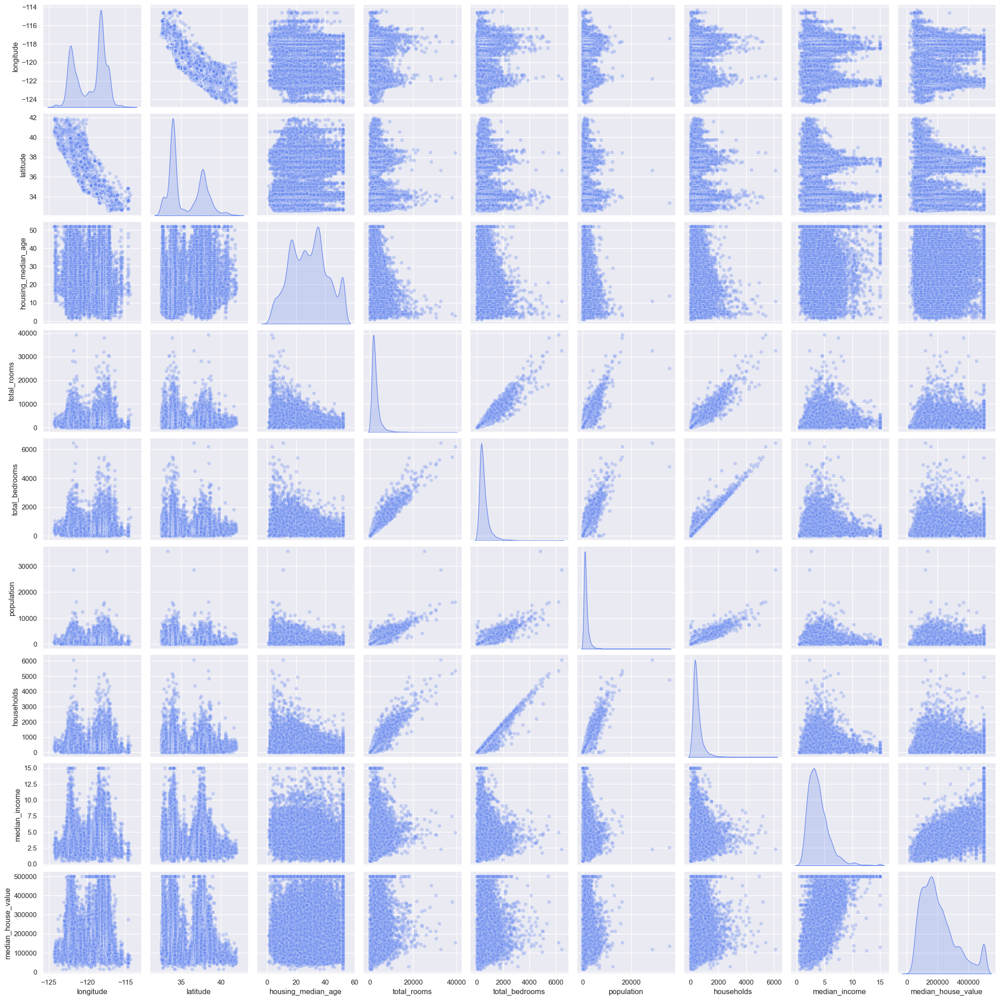

In [6]:
sns.pairplot(df, diag_kind='kde', plot_kws=dict(alpha=SCATTER_ALPHA))

É possível verificar que os valores de housing_median_age e median_income tem um acúmulo de valores em (50,5000) e 50000 respectivamente, o que pode causar problemas na interpretação do modelo. Além disso, a distribuição dos dados apresenta um alongamento à direita (histogramas na diagonal), o que pode indicar a presença de outliers no conjunto de dados.

### Distribuição dos dados

In [7]:
#Verificando a assimetria da curva dos dados
df.select_dtypes('number').skew()

longitude            -0.297801
latitude              0.465953
housing_median_age    0.060331
total_rooms           4.147343
total_bedrooms        3.459546
population            4.935858
households            3.410438
median_income         1.646657
median_house_value    0.977763
dtype: float64

In [8]:
#Verificando a curtose da curva
df.select_dtypes('number').kurtosis()

longitude             -1.330152
latitude              -1.117760
housing_median_age    -0.800629
total_rooms           32.630927
total_bedrooms        21.985575
population            73.553116
households            22.057988
median_income          4.952524
median_house_value     0.327870
dtype: float64

### Tratamento e limpeza da base de dados

In [9]:
df[df.duplicated()]

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity


In [10]:
df.isnull().sum()

longitude               0
latitude                0
housing_median_age      0
total_rooms             0
total_bedrooms        207
population              0
households              0
median_income           0
median_house_value      0
ocean_proximity         0
dtype: int64

In [11]:
df[df.isnull().any(axis=1)]

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
290,-122.16,37.77,47.0,1256.0,NaN,570.0,218.0,4.3750,161900.0,NEAR BAY
341,-122.17,37.75,38.0,992.0,NaN,732.0,259.0,1.6196,85100.0,NEAR BAY
538,-122.28,37.78,29.0,5154.0,NaN,3741.0,1273.0,2.5762,173400.0,NEAR BAY
563,-122.24,37.75,45.0,891.0,NaN,384.0,146.0,4.9489,247100.0,NEAR BAY
696,-122.10,37.69,41.0,746.0,NaN,387.0,161.0,3.9063,178400.0,NEAR BAY
...,...,...,...,...,...,...,...,...,...,...
20267,-119.19,34.20,18.0,3620.0,NaN,3171.0,779.0,3.3409,220500.0,NEAR OCEAN
20268,-119.18,34.19,19.0,2393.0,NaN,1938.0,762.0,1.6953,167400.0,NEAR OCEAN
20372,-118.88,34.17,15.0,4260.0,NaN,1701.0,669.0,5.1033,410700.0,<1H OCEAN
20460,-118.75,34.29,17.0,5512.0,NaN,2734.0,814.0,6.6073,258100.0,<1H OCEAN


In [12]:
df[df.isnull().any(axis=1)].describe()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
count,207.000000,207.000000,207.000000,207.000000,0.0,207.000000,207.000000,207.000000,207.000000
mean,-119.472560,35.497633,29.270531,2562.603865,NaN,1477.772947,510.024155,3.822244,206007.280193
std,2.001424,2.097298,11.964927,1787.269789,NaN,1057.448212,386.120704,1.955595,111638.214545
min,-124.130000,32.660000,4.000000,154.000000,NaN,37.000000,16.000000,0.852700,45800.000000
25%,-121.810000,33.970000,19.000000,1307.500000,NaN,781.000000,258.000000,2.564150,128750.000000
50%,-118.490000,34.200000,30.000000,2155.000000,NaN,1217.000000,427.000000,3.411500,175000.000000
75%,-117.985000,37.495000,38.000000,3465.000000,NaN,1889.500000,628.000000,4.615750,267700.000000
max,-114.590000,40.920000,52.000000,11709.000000,NaN,7604.000000,3589.000000,15.000100,500001.000000


In [13]:
df['ocean_proximity'].value_counts()

ocean_proximity
<1H OCEAN     9136
INLAND        6551
NEAR OCEAN    2658
NEAR BAY      2290
ISLAND           5
Name: count, dtype: int64

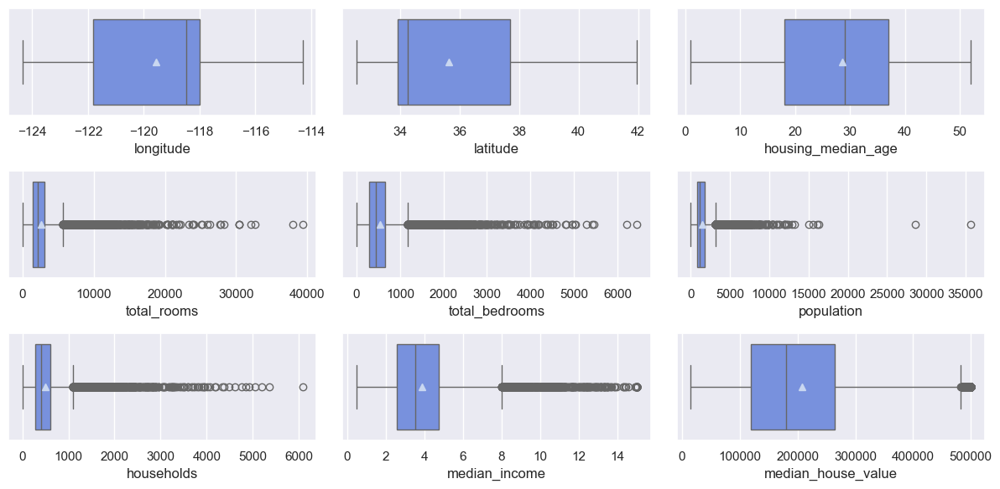

In [14]:
fix, axs = plt.subplots(3, 3, figsize=(12,6))

for ax, coluna in zip(axs.flatten(), df.columns):
    sns.boxplot(data=df, x=coluna, showmeans=True, ax=ax)

plt.tight_layout()
plt.show()

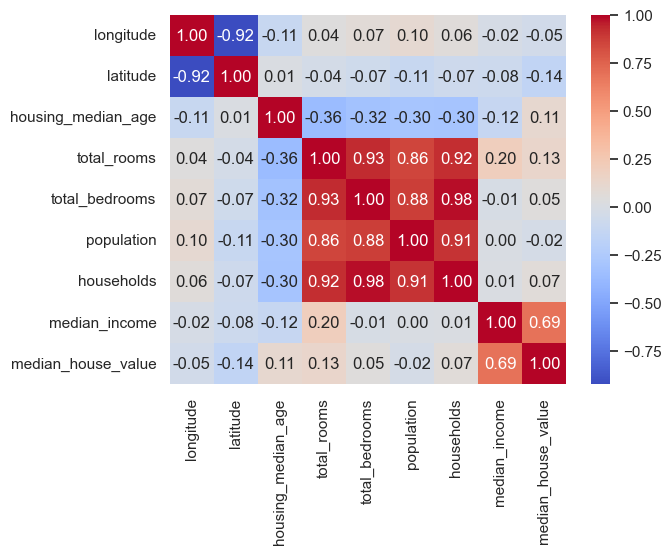

In [15]:
fig, ax = plt.subplots()

sns.heatmap(
    data=df.select_dtypes('number').corr(),
    annot=True,
    fmt='.2f',
    cmap='coolwarm',
)

plt.show()

Podemos verificar que existem algumas correlações entre `total_rooms`, `total_bedrooms`, `population` e `households` por exemplo, mas em relação ao target (`median_house_value`) temos apenas a média salarial como parâmetro correlato à variável. Por isso, para tentar descrever melhor esses dados e tentar identificar outras caracterísicas relevantes, podemos criar algumas variáveis auxiliares com esse objetivo. 

Variáveis a serem criadas para auxiliar na análise de correlação:

- Criar classes em `median_income`
- Quartos por cômodos
- Cômodos por domicílio
- Pessoas por domicílio

In [16]:
df['median_income_cat'] = pd.cut(
    df['median_income'],
    bins=[0, 1.5, 3, 4.5, 6, np.inf],
    labels=[1, 2, 3, 4, 5],
)

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 11 columns):
 #   Column              Non-Null Count  Dtype   
---  ------              --------------  -----   
 0   longitude           20640 non-null  float64 
 1   latitude            20640 non-null  float64 
 2   housing_median_age  20640 non-null  float64 
 3   total_rooms         20640 non-null  float64 
 4   total_bedrooms      20433 non-null  float64 
 5   population          20640 non-null  float64 
 6   households          20640 non-null  float64 
 7   median_income       20640 non-null  float64 
 8   median_house_value  20640 non-null  float64 
 9   ocean_proximity     20640 non-null  object  
 10  median_income_cat   20640 non-null  category
dtypes: category(1), float64(9), object(1)
memory usage: 1.6+ MB


In [17]:
df['median_income_cat'].value_counts().sort_index()

median_income_cat
1     822
2    6581
3    7236
4    3639
5    2362
Name: count, dtype: int64

In [18]:
df['bedrooms_per_room'] = df['total_bedrooms'] / df['total_rooms']
df['rooms_per_households'] = df['total_rooms'] / df['households']
df['population_per_households'] = df['population'] / df['households']

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 14 columns):
 #   Column                     Non-Null Count  Dtype   
---  ------                     --------------  -----   
 0   longitude                  20640 non-null  float64 
 1   latitude                   20640 non-null  float64 
 2   housing_median_age         20640 non-null  float64 
 3   total_rooms                20640 non-null  float64 
 4   total_bedrooms             20433 non-null  float64 
 5   population                 20640 non-null  float64 
 6   households                 20640 non-null  float64 
 7   median_income              20640 non-null  float64 
 8   median_house_value         20640 non-null  float64 
 9   ocean_proximity            20640 non-null  object  
 10  median_income_cat          20640 non-null  category
 11  bedrooms_per_room          20433 non-null  float64 
 12  rooms_per_households       20640 non-null  float64 
 13  population_per_households  2064

In [19]:
df.describe()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,bedrooms_per_room,rooms_per_households,population_per_households
count,20640.000000,20640.000000,20640.000000,20640.000000,20433.000000,20640.000000,20640.000000,20640.000000,20640.000000,20433.000000,20640.000000,20640.000000
mean,-119.569704,35.631861,28.639486,2635.763081,537.870553,1425.476744,499.539680,3.870671,206855.816909,0.213039,5.429000,3.070655
std,2.003532,2.135952,12.585558,2181.615252,421.385070,1132.462122,382.329753,1.899822,115395.615874,0.057983,2.474173,10.386050
min,-124.350000,32.540000,1.000000,2.000000,1.000000,3.000000,1.000000,0.499900,14999.000000,0.100000,0.846154,0.692308
25%,-121.800000,33.930000,18.000000,1447.750000,296.000000,787.000000,280.000000,2.563400,119600.000000,0.175427,4.440716,2.429741
50%,-118.490000,34.260000,29.000000,2127.000000,435.000000,1166.000000,409.000000,3.534800,179700.000000,0.203162,5.229129,2.818116
75%,-118.010000,37.710000,37.000000,3148.000000,647.000000,1725.000000,605.000000,4.743250,264725.000000,0.239821,6.052381,3.282261
max,-114.310000,41.950000,52.000000,39320.000000,6445.000000,35682.000000,6082.000000,15.000100,500001.000000,1.000000,141.909091,1243.333333


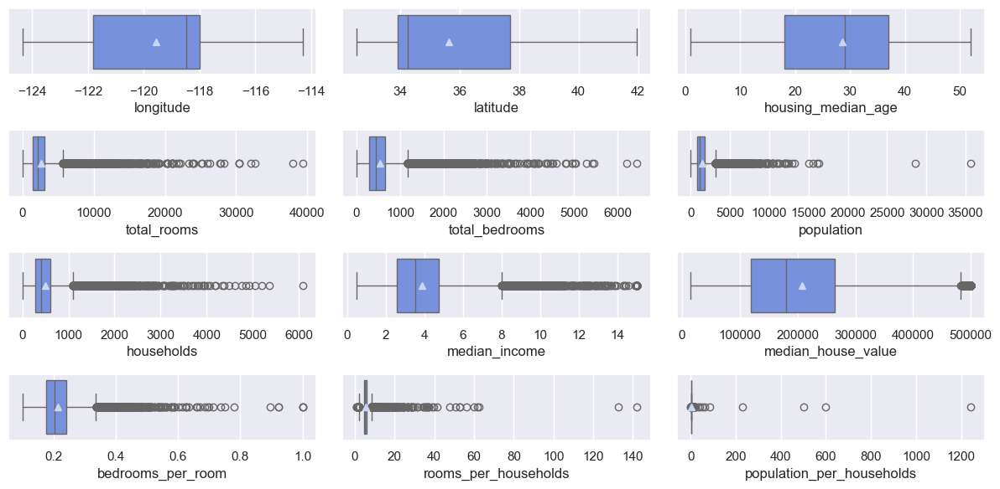

In [20]:
fix, axs = plt.subplots(4, 3, figsize=(12,6))

for ax, coluna in zip(axs.flatten(), df.select_dtypes('number').columns):
    sns.boxplot(data=df, x=coluna, showmeans=True, ax=ax)

plt.tight_layout()
plt.show()

Esse conjunto de dados possui alguns outliers que podemos tratar para evitar que prejudique a aprendizagem do modelo, sendo assim vamos tratar esses registros que tem uma diferença significativa em relação aos demais dados. 

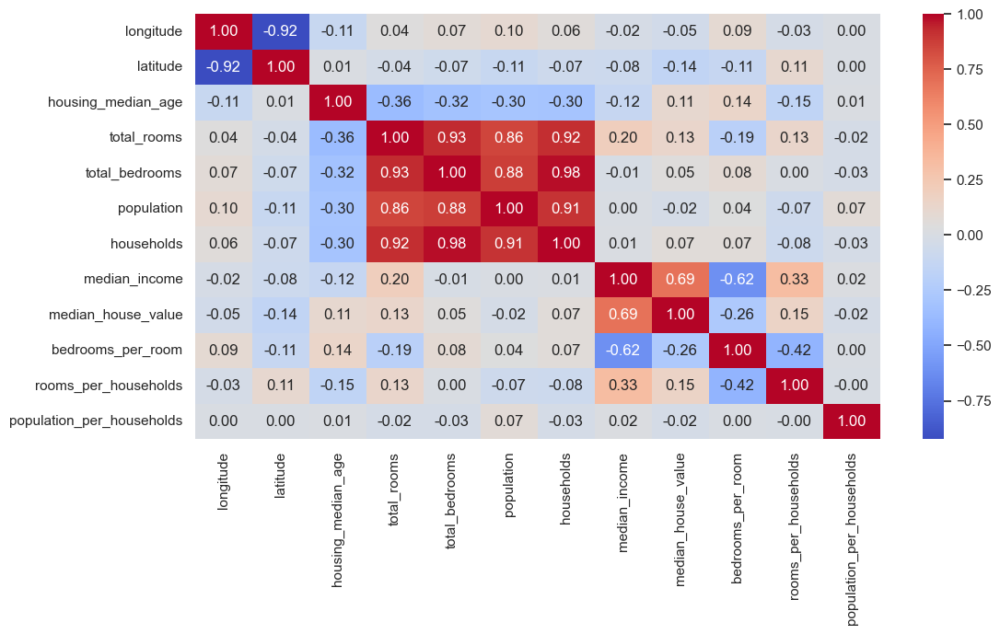

In [21]:
fig, ax = plt.subplots(figsize=(12,6))

sns.heatmap(
    data=df.select_dtypes('number').corr(),
    annot=True,
    fmt='.2f',
    cmap='coolwarm',
)

plt.show()

In [22]:
df[df['median_house_value'] == df['median_house_value'].max()]

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity,median_income_cat,bedrooms_per_room,rooms_per_households,population_per_households
89,-122.27,37.80,52.0,249.0,78.0,396.0,85.0,1.2434,500001.0,NEAR BAY,1,0.313253,2.929412,4.658824
459,-122.25,37.87,52.0,609.0,236.0,1349.0,250.0,1.1696,500001.0,NEAR BAY,1,0.387521,2.436000,5.396000
493,-122.24,37.86,52.0,1668.0,225.0,517.0,214.0,7.8521,500001.0,NEAR BAY,5,0.134892,7.794393,2.415888
494,-122.24,37.85,52.0,3726.0,474.0,1366.0,496.0,9.3959,500001.0,NEAR BAY,5,0.127214,7.512097,2.754032
509,-122.23,37.83,52.0,2990.0,379.0,947.0,361.0,7.8772,500001.0,NEAR BAY,5,0.126756,8.282548,2.623269
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20422,-118.90,34.14,35.0,1503.0,263.0,576.0,216.0,5.1457,500001.0,<1H OCEAN,4,0.174983,6.958333,2.666667
20426,-118.69,34.18,11.0,1177.0,138.0,415.0,119.0,10.0472,500001.0,<1H OCEAN,5,0.117247,9.890756,3.487395
20427,-118.80,34.19,4.0,15572.0,2222.0,5495.0,2152.0,8.6499,500001.0,<1H OCEAN,5,0.142692,7.236059,2.553439
20436,-118.69,34.21,10.0,3663.0,409.0,1179.0,371.0,12.5420,500001.0,<1H OCEAN,5,0.111657,9.873315,3.177898


In [23]:
965 / df.shape[0]

0.04675387596899225

In [24]:
df[df['median_house_value'] == df['median_house_value'].min()]

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity,median_income_cat,bedrooms_per_room,rooms_per_households,population_per_households
2521,-122.74,39.71,16.0,255.0,73.0,85.0,38.0,1.6607,14999.0,INLAND,2,0.286275,6.710526,2.236842
2799,-117.02,36.40,19.0,619.0,239.0,490.0,164.0,2.1000,14999.0,INLAND,2,0.386107,3.774390,2.987805
9188,-117.86,34.24,52.0,803.0,267.0,628.0,225.0,4.1932,14999.0,INLAND,3,0.332503,3.568889,2.791111
19802,-123.17,40.31,36.0,98.0,28.0,18.0,8.0,0.5360,14999.0,INLAND,1,0.285714,12.250000,2.250000


In [25]:
df_clean = df.copy()

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 14 columns):
 #   Column                     Non-Null Count  Dtype   
---  ------                     --------------  -----   
 0   longitude                  20640 non-null  float64 
 1   latitude                   20640 non-null  float64 
 2   housing_median_age         20640 non-null  float64 
 3   total_rooms                20640 non-null  float64 
 4   total_bedrooms             20433 non-null  float64 
 5   population                 20640 non-null  float64 
 6   households                 20640 non-null  float64 
 7   median_income              20640 non-null  float64 
 8   median_house_value         20640 non-null  float64 
 9   ocean_proximity            20640 non-null  object  
 10  median_income_cat          20640 non-null  category
 11  bedrooms_per_room          20433 non-null  float64 
 12  rooms_per_households       20640 non-null  float64 
 13  population_per_households  2064

In [26]:
QUANTIL = 0.99

df_clean = df_clean[
    (df_clean['housing_median_age'] < df_clean['housing_median_age'].quantile(QUANTIL))
    & (df_clean['total_rooms'] < df_clean['total_rooms'].quantile(QUANTIL))
    & (df_clean['total_bedrooms'] < df_clean['total_bedrooms'].quantile(QUANTIL))
    & (df_clean['population'] < df_clean['population'].quantile(QUANTIL))
    & (df_clean['households'] < df_clean['households'].quantile(QUANTIL))
    & (df_clean['median_income'] < df_clean['median_income'].quantile(QUANTIL))
    & (df_clean['median_house_value'] < df_clean['median_house_value'].quantile(QUANTIL))
    & (df_clean['bedrooms_per_room'] < df_clean['bedrooms_per_room'].quantile(QUANTIL))
    & (df_clean['rooms_per_households'] < df_clean['rooms_per_households'].quantile(QUANTIL))
    & (df_clean['population_per_households'] < df_clean['population_per_households'].quantile(QUANTIL))
]

df_clean.info()

<class 'pandas.core.frame.DataFrame'>
Index: 17566 entries, 0 to 20639
Data columns (total 14 columns):
 #   Column                     Non-Null Count  Dtype   
---  ------                     --------------  -----   
 0   longitude                  17566 non-null  float64 
 1   latitude                   17566 non-null  float64 
 2   housing_median_age         17566 non-null  float64 
 3   total_rooms                17566 non-null  float64 
 4   total_bedrooms             17566 non-null  float64 
 5   population                 17566 non-null  float64 
 6   households                 17566 non-null  float64 
 7   median_income              17566 non-null  float64 
 8   median_house_value         17566 non-null  float64 
 9   ocean_proximity            17566 non-null  object  
 10  median_income_cat          17566 non-null  category
 11  bedrooms_per_room          17566 non-null  float64 
 12  rooms_per_households       17566 non-null  float64 
 13  population_per_households  17566 non

In [27]:
1 - df_clean.shape[0] / df.shape[0]

0.14893410852713174

In [28]:
df_clean.describe()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,bedrooms_per_room,rooms_per_households,population_per_households
count,17566.000000,17566.000000,17566.000000,17566.000000,17566.000000,17566.000000,17566.000000,17566.000000,17566.000000,17566.000000,17566.000000,17566.000000
mean,-119.509858,35.601950,27.276955,2510.361152,515.361209,1386.223557,483.953034,3.696453,189591.204486,0.211654,5.253849,2.934597
std,1.984173,2.147246,11.323320,1593.957111,320.838680,844.886263,295.554440,1.541904,95988.907554,0.048323,1.134053,0.691400
min,-124.300000,32.540000,1.000000,6.000000,2.000000,3.000000,2.000000,0.499900,14999.000000,0.113535,1.714286,0.750000
25%,-121.600000,33.920000,18.000000,1464.250000,300.000000,816.000000,287.000000,2.547325,114300.000000,0.176919,4.446441,2.470168
50%,-118.460000,34.240000,28.000000,2131.000000,438.000000,1196.000000,415.000000,3.479200,171400.000000,0.203474,5.205218,2.852579
75%,-117.980000,37.670000,36.000000,3124.000000,643.000000,1738.000000,605.000000,4.622150,243800.000000,0.239171,5.960973,3.306344
max,-114.550000,41.950000,51.000000,11026.000000,2205.000000,5804.000000,1979.000000,10.594100,500000.000000,0.406295,10.352941,5.392954


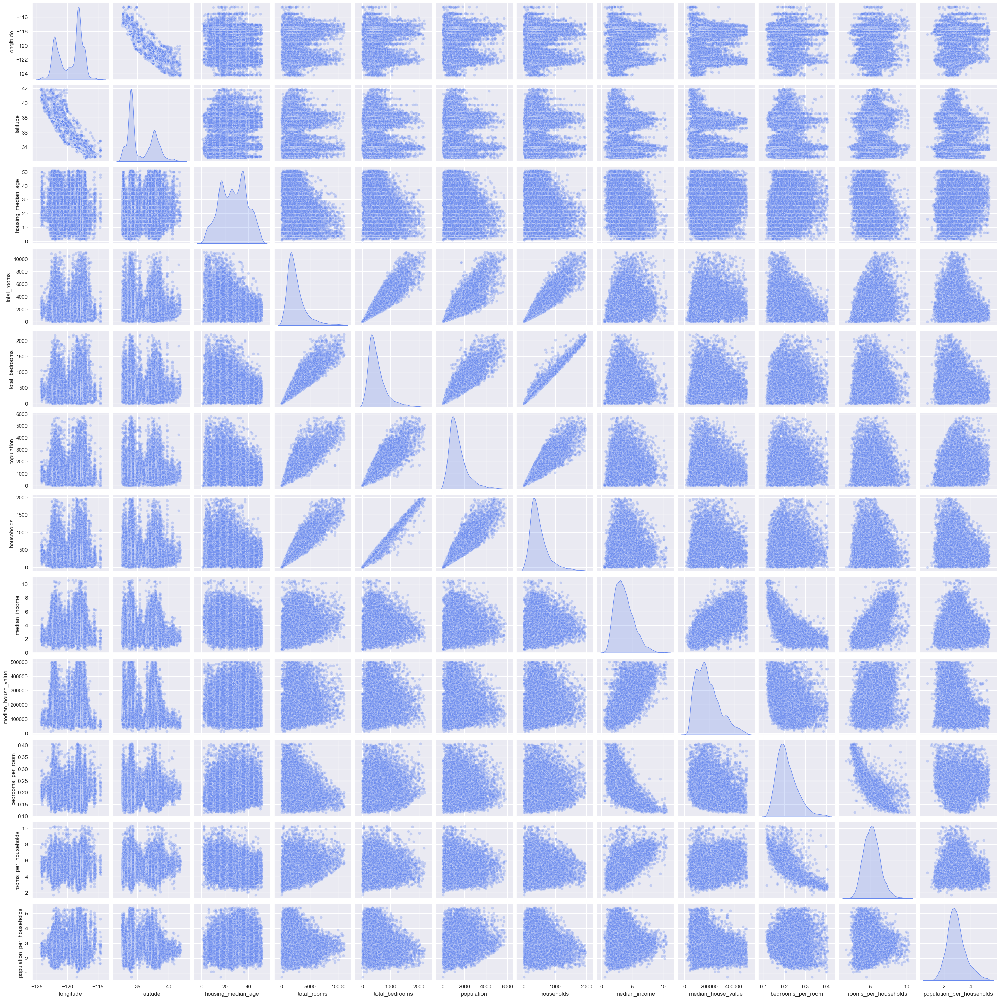

In [29]:
sns.pairplot(df_clean, diag_kind='kde', plot_kws=dict(alpha=SCATTER_ALPHA))

Podemos ver que a limpeza de outliers por meio dos quantis melhorou a distribuição dos dados sem prejudicar a amostragem (redução de apenas 14,9% aproximadamente), em comparação com o primeiro pairplot, podemos ver que as diagonais não estão tão alongadas à direita o indica uma distribuição mais assimétrica. 

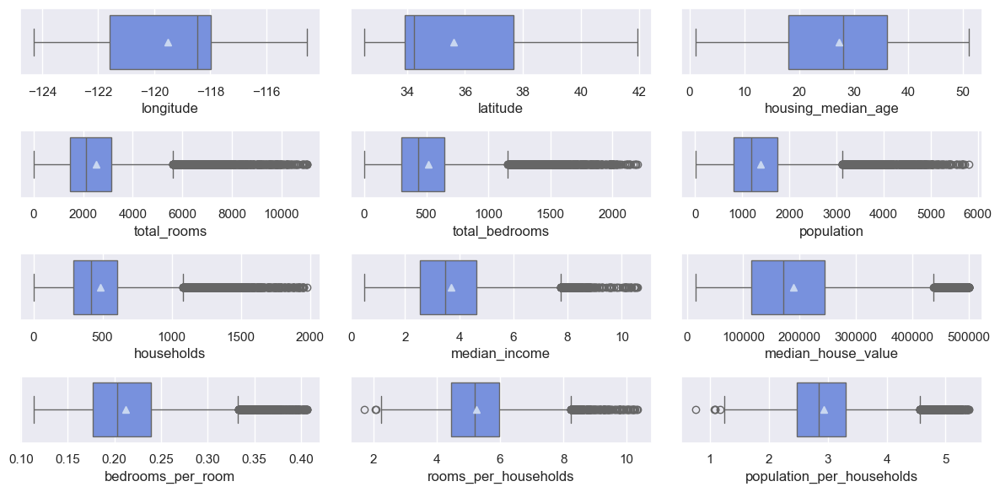

In [30]:
fix, axs = plt.subplots(4, 3, figsize=(12,6))

for ax, coluna in zip(axs.flatten(), df_clean.select_dtypes('number').columns):
    sns.boxplot(data=df_clean, x=coluna, showmeans=True, ax=ax)

plt.tight_layout()
plt.show()

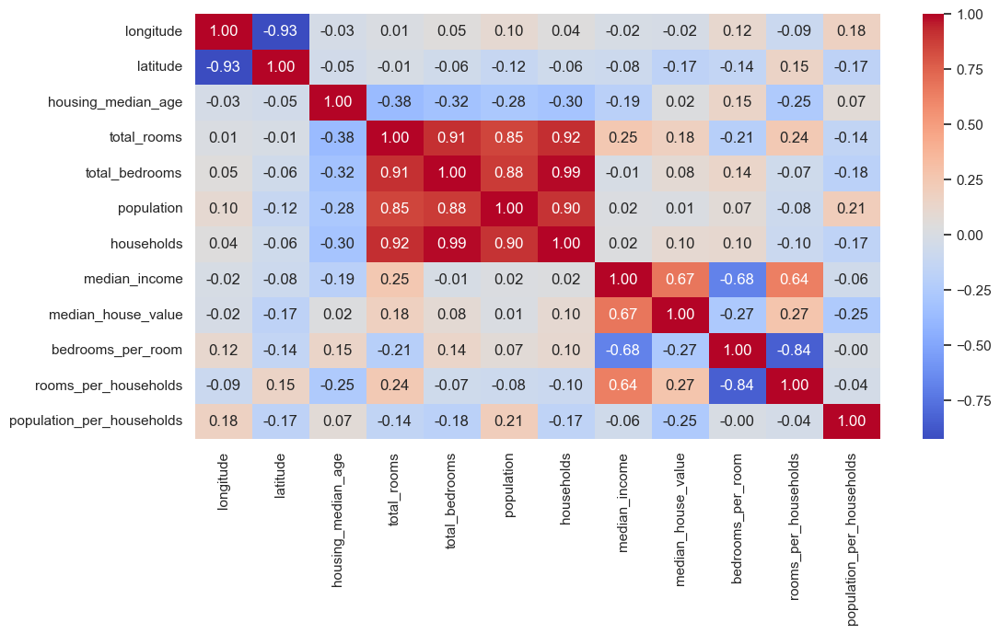

In [31]:
fig, ax = plt.subplots(figsize=(12,6))

sns.heatmap(
    data=df_clean.select_dtypes('number').corr(),
    annot=True,
    fmt='.2f',
    cmap='coolwarm',
)

plt.show()

In [32]:
df_clean['ocean_proximity'].value_counts()

ocean_proximity
<1H OCEAN     7889
INLAND        5935
NEAR OCEAN    2224
NEAR BAY      1516
ISLAND           2
Name: count, dtype: int64

Após a limpeza dos outliers, podemos observar que existem dois registros de ISLAND na base de dados, o que não contribui muito para o aprendizado do modelo já que a quantidade amostral é pouco significativa frente as demais categorias. Portanto, vamos descartar esses valores já que eles não irão influenciar no nosso resultado final, considerando que nossa previsão terá como alvo as categorias com amostragens satisfatórias. 

In [33]:
df_clean = df_clean.loc[df_clean['ocean_proximity'] != 'ISLAND']

df_clean['ocean_proximity'].value_counts()

ocean_proximity
<1H OCEAN     7889
INLAND        5935
NEAR OCEAN    2224
NEAR BAY      1516
Name: count, dtype: int64

In [34]:
df_clean['ocean_proximity'] = df_clean['ocean_proximity'].astype('category')

df_clean.info()

<class 'pandas.core.frame.DataFrame'>
Index: 17564 entries, 0 to 20639
Data columns (total 14 columns):
 #   Column                     Non-Null Count  Dtype   
---  ------                     --------------  -----   
 0   longitude                  17564 non-null  float64 
 1   latitude                   17564 non-null  float64 
 2   housing_median_age         17564 non-null  float64 
 3   total_rooms                17564 non-null  float64 
 4   total_bedrooms             17564 non-null  float64 
 5   population                 17564 non-null  float64 
 6   households                 17564 non-null  float64 
 7   median_income              17564 non-null  float64 
 8   median_house_value         17564 non-null  float64 
 9   ocean_proximity            17564 non-null  category
 10  median_income_cat          17564 non-null  category
 11  bedrooms_per_room          17564 non-null  float64 
 12  rooms_per_households       17564 non-null  float64 
 13  population_per_households  17564 non

C:\Users\Samuel\AppData\Local\Temp\ipykernel_20580\1578887536.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_clean['ocean_proximity'] = df_clean['ocean_proximity'].astype('category')


Apesar de não ser necessário nessa base de dados, vamos otimizar a base visando uma maior eficiência e tempo de carregamento das features do modelo. Como boa prática, é sempre interessante reduzir o espaço em memória ocupado e por isso vamos fazer esse tratamento para casos em que a base tenha um volume expressivo de dados. 

In [35]:
colunas_valores_inteiros = []

for coluna in df_clean.select_dtypes('number').columns:
    if df_clean[coluna].apply(float.is_integer).all():
        colunas_valores_inteiros.append(coluna)

colunas_valores_inteiros

['housing_median_age',
 'total_rooms',
 'total_bedrooms',
 'population',
 'households',
 'median_house_value']

In [36]:
colunas_valores_float = df_clean.select_dtypes('number').columns.difference(colunas_valores_inteiros)

colunas_valores_float

Index(['bedrooms_per_room', 'latitude', 'longitude', 'median_income',
       'population_per_households', 'rooms_per_households'],
      dtype='object')

In [37]:
df_clean[colunas_valores_inteiros] = df_clean[colunas_valores_inteiros].apply(
    pd.to_numeric, downcast='integer'
)

df_clean[colunas_valores_float] = df_clean[colunas_valores_float].apply(
    pd.to_numeric, downcast='float'
)

df_clean.info()

<class 'pandas.core.frame.DataFrame'>
Index: 17564 entries, 0 to 20639
Data columns (total 14 columns):
 #   Column                     Non-Null Count  Dtype   
---  ------                     --------------  -----   
 0   longitude                  17564 non-null  float32 
 1   latitude                   17564 non-null  float32 
 2   housing_median_age         17564 non-null  int8    
 3   total_rooms                17564 non-null  int16   
 4   total_bedrooms             17564 non-null  int16   
 5   population                 17564 non-null  int16   
 6   households                 17564 non-null  int16   
 7   median_income              17564 non-null  float32 
 8   median_house_value         17564 non-null  int32   
 9   ocean_proximity            17564 non-null  category
 10  median_income_cat          17564 non-null  category
 11  bedrooms_per_room          17564 non-null  float32 
 12  rooms_per_households       17564 non-null  float32 
 13  population_per_households  17564 non

C:\Users\Samuel\AppData\Local\Temp\ipykernel_20580\3597642795.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_clean[colunas_valores_inteiros] = df_clean[colunas_valores_inteiros].apply(
C:\Users\Samuel\AppData\Local\Temp\ipykernel_20580\3597642795.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_clean[colunas_valores_float] = df_clean[colunas_valores_float].apply(


In [38]:
df_clean.describe()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,bedrooms_per_room,rooms_per_households,population_per_households
count,17564.000000,17564.000000,17564.000000,17564.000000,17564.000000,17564.000000,17564.000000,17564.000000,17564.000000,17564.000000,17564.000000,17564.000000
mean,-119.509995,35.602200,27.276873,2510.510875,515.378046,1386.315019,483.979447,3.696602,189570.803803,0.211643,5.253923,2.934664
std,1.984251,2.147238,11.323957,1593.977891,320.848886,844.889138,295.559700,1.541926,95971.413796,0.048315,1.134086,0.691409
min,-124.300003,32.540001,1.000000,6.000000,2.000000,3.000000,2.000000,0.499900,14999.000000,0.113535,1.714286,0.750000
25%,-121.599998,33.919998,18.000000,1464.750000,300.000000,816.000000,287.000000,2.547375,114300.000000,0.176919,4.446466,2.470259
50%,-118.459999,34.240002,28.000000,2131.000000,438.000000,1196.000000,415.000000,3.479200,171400.000000,0.203465,5.205450,2.852657
75%,-117.980003,37.669998,36.000000,3124.000000,643.000000,1738.000000,605.000000,4.622525,243800.000000,0.239151,5.961016,3.306427
max,-114.550003,41.950001,51.000000,11026.000000,2205.000000,5804.000000,1979.000000,10.594100,500000.000000,0.406295,10.352942,5.392954


In [39]:
df_clean.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity,median_income_cat,bedrooms_per_room,rooms_per_households,population_per_households
0,-122.230003,37.880001,41,880,129,322,126,8.3252,452600,NEAR BAY,5,0.146591,6.984127,2.555556
1,-122.220001,37.860001,21,7099,1106,2401,1138,8.3014,358500,NEAR BAY,5,0.155797,6.238137,2.109842
8,-122.260002,37.840000,42,2555,665,1206,595,2.0804,226700,NEAR BAY,2,0.260274,4.294117,2.026891
15,-122.260002,37.849998,50,1120,283,697,264,2.1250,140000,NEAR BAY,2,0.252679,4.242424,2.640152
18,-122.260002,37.840000,50,2239,455,990,419,1.9911,158700,NEAR BAY,2,0.203216,5.343676,2.362768


In [40]:
df_clean = df_clean.reset_index(drop='True')

df_clean.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity,median_income_cat,bedrooms_per_room,rooms_per_households,population_per_households
0,-122.230003,37.880001,41,880,129,322,126,8.3252,452600,NEAR BAY,5,0.146591,6.984127,2.555556
1,-122.220001,37.860001,21,7099,1106,2401,1138,8.3014,358500,NEAR BAY,5,0.155797,6.238137,2.109842
2,-122.260002,37.840000,42,2555,665,1206,595,2.0804,226700,NEAR BAY,2,0.260274,4.294117,2.026891
3,-122.260002,37.849998,50,1120,283,697,264,2.1250,140000,NEAR BAY,2,0.252679,4.242424,2.640152
4,-122.260002,37.840000,50,2239,455,990,419,1.9911,158700,NEAR BAY,2,0.203216,5.343676,2.362768


In [41]:
#Exportando os dados em limpos em parquet para manter as otimizações que foram efetuadas
df_clean.to_parquet(DADOS_LIMPOS, index=False)